# MEDICAL DECISION SUPPORT APPLICATION PREDICTING SUCCESS OF PEDIATRIC BONE MARROW TRANSPLANTS WITH EXPLAINABLE ML (SHAP)

## LIBRARY DOWNLOAD

In [ ]:
#pip install ucimlrepo ipywidgets ydata-profiling

## DATA IMPORTATION

In [ ]:
from ucimlrepo import fetch_ucirepo
import pandas as pd

# fetch dataset
bone_marrow_transplant_children = fetch_ucirepo(id=565)

# data (as pandas dataframes)
X = bone_marrow_transplant_children.data.features
y = bone_marrow_transplant_children.data.targets
df = pd.concat([X, y], axis=1)


## I-   EXPLORATION ET NETTOYAGE DES DONNEES

### ANALYSE DESCRITIVE DES DONNEES

In [ ]:
from ydata_profiling import ProfileReport

# Generation d'un rapport personnalisé
profile = ProfileReport(df, title="Data Profiling Report")

# Création d'un fichier HTML pour le rapport
profile.to_file("data_profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:

# Affichage du rapport
profile.to_notebook_iframe()

### TRAITEMENT DES VALEURS MANQUANTES

Tout d'abord, nous allons vérifier la proportion de valeurs manquantes dans le jeu de données par colonne.

Ici, nous remarquons que quelques valeurs sont manquantes. En terme de priorité, nous avons `extcGvHD` qui contient **16.6%** de valeurs manquantes, suivi de `CMVstatus`(**8.6%**), `RecipientCMV`(**7.5%**), `CD3dCD34` et `CD3dkgx10d8`(**2.7%**).

Pour ce qui est des variables `RecipientABO`, `RecipientRH`, `DonorCMV`, `Rbodymass`, `Antigen` et `Allele`, nous avons moins de **2%** de valeurs manquantes.

Ainsi, nous proposons comme recommandation:
-   La suppression les lignes manquantes des variables catégorielles avec un taux faible de valeurs manquantes tandis que celles numeriques seront remplacées par la médiane.
-   La création d'une nouvelle modalité pour les variables catégorielles avec un taux de valeurs manquantes élevé telles que `extcGvHD`, `CMVstatus` et `RecipientCMV`. Ainsi, nous pourrons ensuite remplacer les valeurs manquantes par une nouvelle modalité `'Inconnu'`.
-   L'imputation des valeurs manquantes pour les variables numériques avec un taux élevé de valeurs manquantes par la médiane.

In [ ]:
"""
Remplacement des valeurs manquantes par une valeur quelconque pour la colonne extcGvHD
représentant la nouvelle modalité 'Inconnu'.
"""

df.loc[:, 'extcGvHD'] = df['extcGvHD'].fillna(2)
# Idem pour 'CMVstatus' et 'RecipientCMV'
df.loc[:, 'CMVstatus'] = df['CMVstatus'].fillna(4)
df.loc[:, 'RecipientCMV'] = df['RecipientCMV'].fillna(2)

"""
Remplacement des valeurs manquantes par la médiane pour les colonnes
CD3dCD34 et CD3dkgx10d8.
"""

df.loc[:, 'CD3dCD34'] = df['CD3dCD34'].fillna(df['CD3dCD34'].median())
df.loc[:, 'CD3dkgx10d8'] = df['CD3dkgx10d8'].fillna(df['CD3dkgx10d8'].median())

"""
Suppression des valeurs manquantes pour les colonnes 'RecipientABO', 'DonorCMV',
'Antigen' et 'Allele'.
"""
categorical_low_missing = ['RecipientABO', 'DonorCMV', 'RecipientRh', 'Antigen', 'Allele']
df = df.dropna(subset=categorical_low_missing)

"""
Remplacement des valeurs manquantes pour la colonne 'Rbodymass' par la médiane.
"""
df.loc[:, 'Rbodymass'] = df['Rbodymass'].fillna(df['Rbodymass'].median())

In [ ]:
# Vérification des valeurs manquantes après le traitement
import pandas

missing_check = pd.DataFrame({
    'Missing_Count': df.isnull().sum(),
    'Missing_Percentage': (df.isnull().sum() / len(df) * 100).round(2)
})

# Affichage des résultats
print("Vérification des valeurs manquantes après traitement:")
print(missing_check.loc[:])

Vérification des valeurs manquantes après traitement:
                      Missing_Count  Missing_Percentage
Recipientgender                   0                 0.0
Stemcellsource                    0                 0.0
Donorage                          0                 0.0
Donorage35                        0                 0.0
IIIV                              0                 0.0
Gendermatch                       0                 0.0
DonorABO                          0                 0.0
RecipientABO                      0                 0.0
RecipientRh                       0                 0.0
ABOmatch                          0                 0.0
CMVstatus                         0                 0.0
DonorCMV                          0                 0.0
RecipientCMV                      0                 0.0
Disease                           0                 0.0
Riskgroup                         0                 0.0
Txpostrelapse                     0               

Les valeurs manquantes étant gérées, nous allons pousser notre analyse descriptive un peu plus loin pour voir si nous pouvons détecter des corrélations entre les variables ou encore des valeurs abérrantes(Outliers).

### RECHERCHE DE VALEURS ABERRANTES

In [ ]:
profile1 = ProfileReport(df, title="Data Profiling Report")

# Création d'un fichier HTML pour le rapport
profile1.to_file("data_profile_report1.html")

c:\Users\JA236842\AppData\Local\Programs\Python\Python312\Lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
for col in df.columns:
    unique_values = df[col].nunique()
    if df[col].dtype in ['int64', 'float64']:
        max_val = df[col].value_counts().keys().max()
        if (max_val <= 6) and (unique_values <= 7):
            # First create a new column with the categorical data
            df[col] = pd.Categorical(df[col].astype(int))
    else:
        if unique_values <= 7:
            df[col] = pd.Categorical(df[col])
df['HLAgrI'] = df3['HLAgrI'].astype('category')
print(df.dtypes)

Recipientgender         category
Stemcellsource          category
Donorage                 float64
Donorage35              category
IIIV                    category
Gendermatch             category
DonorABO                category
RecipientABO            category
RecipientRh             category
ABOmatch                category
CMVstatus               category
DonorCMV                category
RecipientCMV            category
Disease                 category
Riskgroup               category
Txpostrelapse           category
Diseasegroup            category
HLAmatch                category
HLAmismatch             category
Antigen                 category
Allele                  category
HLAgrI                  category
Recipientage             float64
Recipientage10          category
Recipientageint         category
Relapse                 category
aGvHDIIIIV              category
extcGvHD                category
CD34kgx10d6              float64
CD3dCD34                 float64
CD3dkgx10d

C:\Users\JA236842\AppData\Local\Temp\ipykernel_24404\1186433181.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = pd.Categorical(df[col].astype(int))
C:\Users\JA236842\AppData\Local\Temp\ipykernel_24404\1186433181.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = pd.Categorical(df[col].astype(int))
C:\Users\JA236842\AppData\Local\Temp\ipykernel_24404\1186433181.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

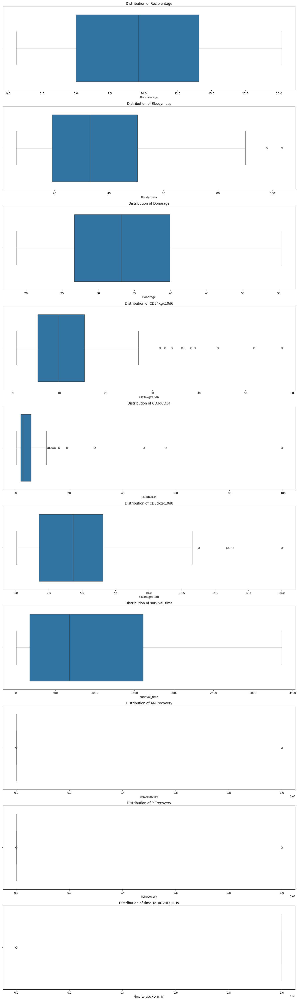


Résumé des valeurs aberrantes:

Rbodymass:
Nombre de valeurs aberrantes: 2
Valeurs aberrantes: [ 97.8 103.4]
Limites: [-27.86, 97.44]

CD34kgx10d6:
Nombre de valeurs aberrantes: 11
Valeurs aberrantes: [51.85 31.57 57.78 38.32 43.96 34.1  36.34 44.   39.07 32.73 36.65]
Limites: [-9.70, 30.49]

CD3dCD34:
Nombre de valeurs aberrantes: 18
Valeurs aberrantes: [19.01323  29.481647 11.883664 12.028841 13.890231 16.186239 12.958576
 14.130301 47.869839 12.479226 12.36598  14.642869 99.56097  56.065024
 19.210978 12.984467 12.272474 16.32616 ]
Limites: [-4.09, 11.69]

CD3dkgx10d8:
Nombre de valeurs aberrantes: 5
Valeurs aberrantes: [16.31 16.07 13.77 15.9  20.02]
Limites: [-5.46, 13.77]

ANCrecovery:
Nombre de valeurs aberrantes: 7
Valeurs aberrantes: [     24      26 1000000 1000000 1000000 1000000 1000000]
Limites: [7.00, 23.00]

PLTrecovery:
Nombre de valeurs aberrantes: 32
Valeurs aberrantes: [     74      88 1000000     112     285 1000000      72 1000000     107
 1000000 1000000      79 

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns

def detect_outliers(df):
    # Séparation des valeurs numériques
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns

    plt.figure(figsize=(15, 5*len(numeric_cols)))

    # Dictionnaire pour stocker les valeurs aberrantes
    outliers_dict = {}

    for i, col in enumerate(numeric_cols, 1):
        # Calcul de la plage interquartile
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1

        # Definition des limites
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detection des valeurs aberrantes
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
        outliers_dict[col] = {
            'outliers': outliers,
            'lower_bound': lower_bound,
            'upper_bound': upper_bound
        }

        plt.subplot(len(numeric_cols), 1, i)
        sns.boxplot(x=df[col])
        plt.title(f'Distribution of {col}')

    plt.tight_layout()
    plt.show()

    print("\nRésumé des valeurs aberrantes:")
    for col, data in outliers_dict.items():
        if len(data['outliers']) > 0:
            print(f"\n{col}:")
            print(f"Nombre de valeurs aberrantes: {len(data['outliers'])}")
            print(f"Valeurs aberrantes: {data['outliers'].values}")
            print(f"Limites: [{data['lower_bound']:.2f}, {data['upper_bound']:.2f}]")

# Application de la fonction
numeric_vars = ['Recipientage', 'Rbodymass',
                'Donorage', 'CD34kgx10d6', 'CD3dCD34',
                'CD3dkgx10d8', 'survival_time', 'ANCrecovery', 'PLTrecovery', 'time_to_aGvHD_III_IV']
detect_outliers(df[numeric_vars])

Ici, nous constatons que certaines variables contiennent des valeurs aberrantes, en particulier pour des variables comme `PLTrecovery`, `ANCrecovery` et la variable `time_to_aGvHD_III_IV`.
-   Dans le cas des variables `PLTrecovery` et `ANCrecovery`, nous constatons plusieurs variables égales à `1000000`, qui semble être un encodage pour un delai relatif à un évènement qui n'est jamais survenu.

**SOLUTION:** Modification des variables `PLTrecovery` et `ANCrecovery` en des variables binaires

-   Dans le cas de la variable `time_to_aGvHD_III_IV`, nous constatons que les limites sont toutes deux égales à `1000000` dû à une forte présence de données ayant pour valeur `1000000`(~145). Cela paraît absurde mais cette valeur semblerait aussi être un encodage pour un delai relatif à un évènement qui n'est jamais survenu.

**SOLUTION:** Modification de la variable `time_to_aGvHD_III_IV` en une variable binaire

-   En ce qui concerne les variables `Rbodymass`, `CD34kgx10d6`, `CD3dCD34` et `CD3dkgx10d8`, les valeurs aberrantes restent médicalement possibles selon nos recherches donc seront concervées.

In [ ]:
df1 = df.copy()

df1['ANCrecovery_status'] = (df['ANCrecovery'] < 1000000).astype('category')
df1['PLTrecovery_status'] = (df['PLTrecovery'] < 1000000).astype('category')
df1['time_to_aGvHD_III_IV_status'] = (df['time_to_aGvHD_III_IV'] < 1000000).astype('category')

df1 = df1.drop(['ANCrecovery', 'PLTrecovery', 'time_to_aGvHD_III_IV'], axis=1)

df1

,Recipientgender,Stemcellsource,Donorage,Donorage35,IIIV,Gendermatch,DonorABO,RecipientABO,RecipientRh,ABOmatch,...,extcGvHD,CD34kgx10d6,CD3dCD34,CD3dkgx10d8,Rbodymass,survival_time,survival_status,ANCrecovery_status,PLTrecovery_status,time_to_aGvHD_III_IV_status
0,1,1,22.830137,0,1,0,1,1,1,0,...,1,7.20,1.338760,5.38,35.0,999,0,True,True,True
1,1,0,23.342466,0,1,0,-1,-1,1,0,...,1,4.50,11.078295,0.41,20.6,163,1,True,True,False
2,1,0,26.394521,0,1,0,-1,-1,1,0,...,1,7.94,19.013230,0.42,23.4,435,1,True,True,False
3,0,0,39.684932,1,1,0,1,2,1,1,...,2,4.25,29.481647,0.14,50.0,53,1,True,True,True
4,0,1,33.358904,0,0,0,1,2,0,1,...,1,51.85,3.972255,13.05,9.0,2043,0,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181,1,1,37.632877,1,0,0,0,1,1,1,...,2,12.58,2.426122,5.19,33.0,6,1,False,False,False
182,1,1,37.575342,1,1,0,1,1,0,0,...,1,11.08,2.522750,4.39,44.0,385,1,True,True,True
183,0,1,22.895890,0,0,0,1,0,1,1,...,1,4.64,1.038858,4.47,44.5,634,1,True,True,False
184,0,1,27.347945,0,1,0,1,-1,1,1,...,1,7.73,1.635559,4.73,33.0,1895,0,True,True,False


### DETECTION DES CORRELATIONS

Cette étape est cruciale car elle nous permet de réduire le nombre de variables et de réduire les correlations entre elles.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Identification automatique des colonnes catégorielles
categorical_columns = df1.select_dtypes(include=['category', 'object']).columns

# Création d'un dictionnaire pour stocker les encoders
label_encoders = {}

# Encoding des colonnes catégorielles
for col in categorical_columns:
    label_encoders[col] = LabelEncoder()
    # Conversion des colonnes catégorielles en valeurs numériques
    df1[col] = pd.Categorical(label_encoders[col].fit_transform(df1[col]))

# Separation des variables explicatives et de la variable cible
X1 = df1.drop('survival_status', axis=1)
y1 = df1['survival_status']

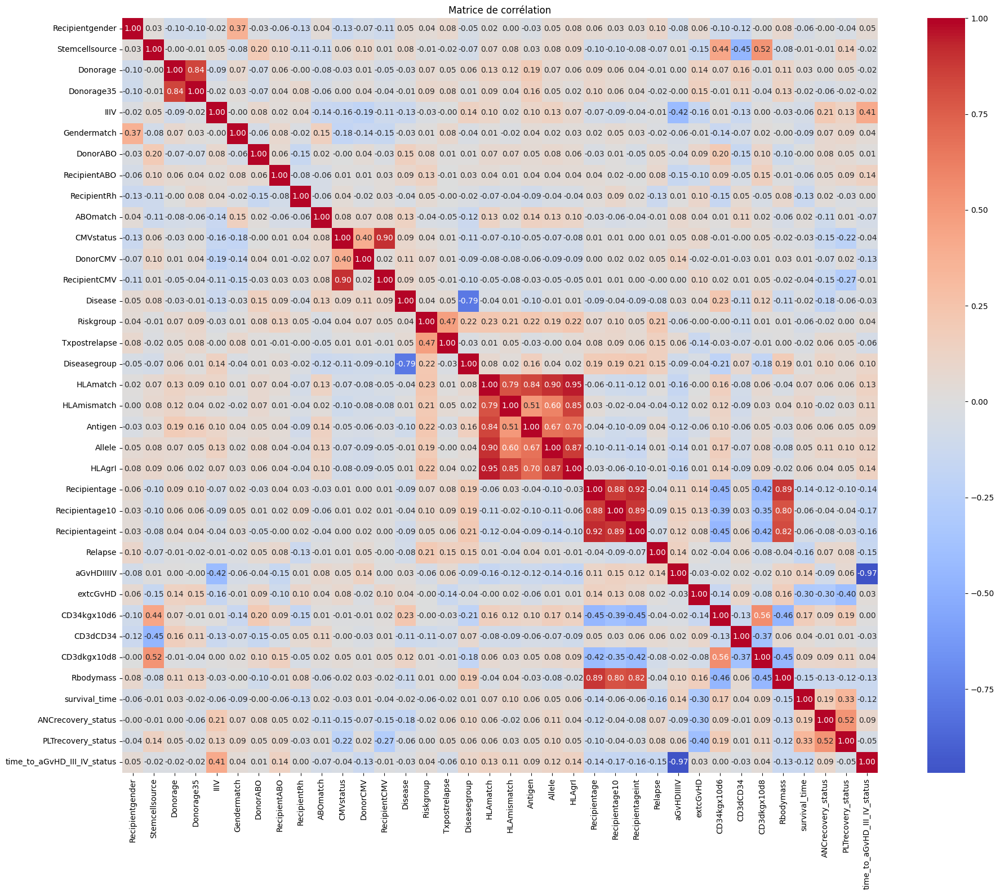


Strong correlations (|correlation| > 0.5):
aGvHDIIIIV -- time_to_aGvHD_III_IV_status: -0.968
HLAgrI -- HLAmatch: 0.947
Recipientage -- Recipientageint: 0.919
Allele -- HLAmatch: 0.901
CMVstatus -- RecipientCMV: 0.901
Recipientage10 -- Recipientageint: 0.890
Rbodymass -- Recipientage: 0.888
Recipientage -- Recipientage10: 0.875
Allele -- HLAgrI: 0.873
HLAgrI -- HLAmismatch: 0.849
Antigen -- HLAmatch: 0.845
Donorage -- Donorage35: 0.842
Rbodymass -- Recipientageint: 0.817
Rbodymass -- Recipientage10: 0.796
HLAmatch -- HLAmismatch: 0.795
Disease -- Diseasegroup: -0.786
Antigen -- HLAgrI: 0.704
Allele -- Antigen: 0.671
Allele -- HLAmismatch: 0.601
CD34kgx10d6 -- CD3dkgx10d8: 0.560
CD3dkgx10d8 -- Stemcellsource: 0.524
ANCrecovery_status -- PLTrecovery_status: 0.524
Antigen -- HLAmismatch: 0.508


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(20, 16))

correlation_matrix = X1.corr()

sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            fmt='.2f',
            square=True)

plt.title('Matrice de corrélation')
plt.tight_layout()
plt.show()

# Affichage des corrélations les plus fortes
high_correlations = (correlation_matrix.abs() > 0.5) & (correlation_matrix != 1.0)
high_corr_pairs = [(i, j, correlation_matrix.loc[i, j])
                   for i in correlation_matrix.index
                   for j in correlation_matrix.columns
                   if high_correlations.loc[i, j] and i < j]

# Rangement par valeur absolue décroissante
high_corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)

print("\nStrong correlations (|correlation| > 0.5):")
for var1, var2, corr in high_corr_pairs:
    print(f"{var1} -- {var2}: {corr:.3f}")


Comme vous pouvez le constater, il y a un bon nombre de variables correlées entre elles. Ce qui est normal, puisque les variables sont liées entre elles. Ainsi donc, il est important de reduire le nombre de variables dans notre ensemble de données pour en garder les plus importantes. De ce fait, nous allons utiliser la méthode de l'ACP pour réduire le nombre de variables.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



Contribution de chaque composante:
CP1: 0.212 (21.2%)
CP2: 0.093 (9.3%)
CP3: 0.086 (8.6%)
CP4: 0.075 (7.5%)
CP5: 0.050 (5.0%)
CP6: 0.041 (4.1%)
CP7: 0.038 (3.8%)
CP8: 0.034 (3.4%)
CP9: 0.032 (3.2%)
CP10: 0.029 (2.9%)
CP11: 0.025 (2.5%)
CP12: 0.024 (2.4%)
CP13: 0.022 (2.2%)
CP14: 0.021 (2.1%)
CP15: 0.019 (1.9%)
CP16: 0.017 (1.7%)
CP17: 0.017 (1.7%)
CP18: 0.015 (1.5%)
CP19: 0.014 (1.4%)
CP20: 0.013 (1.3%)
CP21: 0.012 (1.2%)
CP22: 0.010 (1.0%)
CP23: 0.009 (0.9%)
CP24: 0.009 (0.9%)
CP25: 0.008 (0.8%)
CP26: 0.007 (0.7%)
CP27: 0.007 (0.7%)
CP28: 0.006 (0.6%)
CP29: 0.006 (0.6%)
CP30: 0.005 (0.5%)
CP31: 0.005 (0.5%)
CP32: 0.005 (0.5%)
CP33: 0.004 (0.4%)
CP34: 0.004 (0.4%)
CP35: 0.004 (0.4%)
CP36: 0.004 (0.4%)
CP37: 0.003 (0.3%)
CP38: 0.003 (0.3%)
CP39: 0.003 (0.3%)
CP40: 0.002 (0.2%)
CP41: 0.002 (0.2%)
CP42: 0.002 (0.2%)
CP43: 0.001 (0.1%)
CP44: 0.001 (0.1%)
CP45: 0.001 (0.1%)
CP46: 0.001 (0.1%)
CP47: 0.001 (0.1%)
CP48: 0.000 (0.0%)
CP49: 0.000 (0.0%)
CP50: 0.000 (0.0%)
CP51: 0.000 (0.0%)
CP5

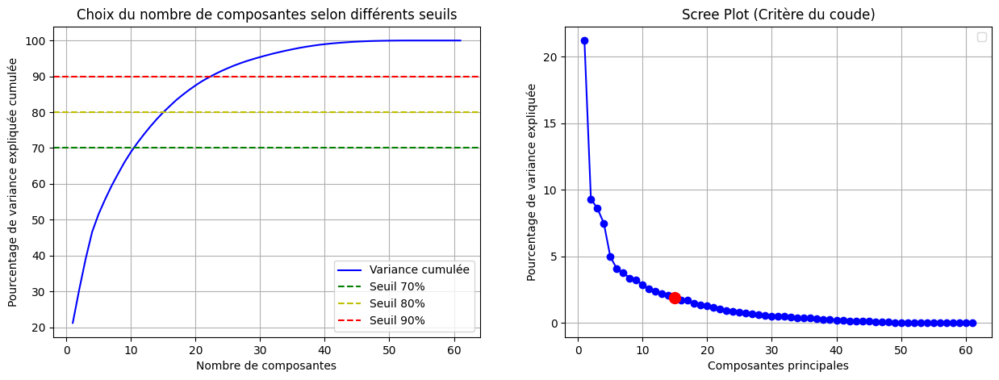

In [ ]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
import numpy as np

# Séparation des colonnes numériques et catégorielles
numeric_columns = X1.select_dtypes(include=['float64', 'int64']).columns
categorical_columns = X1.select_dtypes(include=['object', 'category', 'bool']).columns

# Création du préprocesseur avec le nouveau paramètre sparse_output
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_columns),
        ('cat', OneHotEncoder(drop='first', sparse_output=False), categorical_columns)
    ])

# Préparation des données
preprocessed_data = preprocessor.fit_transform(df1)

# Application de l'ACP
pca = PCA()
pca_result = pca.fit_transform(preprocessed_data)

# Calcul des variances expliquées
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Visualisations
plt.figure(figsize=(15, 5))

# 1. Variance expliquée cumulée
plt.subplot(1, 2, 1)
plt.plot(range(1, len(cumulative_variance_ratio) + 1), cumulative_variance_ratio * 100, 'b-', label='Variance cumulée')
plt.axhline(y=70, color='g', linestyle='--', label='Seuil 70%')
plt.axhline(y=80, color='y', linestyle='--', label='Seuil 80%')
plt.axhline(y=90, color='r', linestyle='--', label='Seuil 90%')
plt.xlabel('Nombre de composantes')
plt.ylabel('Pourcentage de variance expliquée cumulée')
plt.title('Choix du nombre de composantes selon différents seuils')
plt.legend()
plt.grid(True)

# 2. Scree plot avec critère du coude
plt.subplot(1, 2, 2)
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio * 100, 'bo-')
plt.plot(15, explained_variance_ratio[14] * 100, 'ro', markersize=10)
plt.xlabel('Composantes principales')
plt.ylabel('Pourcentage de variance expliquée')
plt.title('Scree Plot (Critère du coude)')
plt.grid(True)
plt.legend()

# Affichage des résultats
print("\nContribution de chaque composante:")
for i, ratio in enumerate(explained_variance_ratio[:], 1):
    print(f"CP{i}: {ratio:.3f} ({ratio*100:.1f}%)")

Comme vous pouvez le constater ci-dessus, 15 composantes principal représentent environ **80%** de la variance. Nous allons donc utiliser ces 15 composantes pour la suite du projet. Pour ce faire, nous allons conserver la variable la plus representative de chacune des 15 premières composantes principales pour construire notre nouvelle base de données.

In [ ]:
# Obtenir les coefficients (loadings) des composantes principales
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f'PC{i+1}' for i in range(len(pca.components_))],
    index=preprocessor.get_feature_names_out()
)

# Pour chaque composante principale (jusqu'à PC15), trouver la variable la plus influente
print("\nVariables les plus représentatives pour les 15 premières composantes principales:")
original_vars = []  # Liste pour stocker les variables originales
for i in range(15):
    pc = f'PC{i+1}'
    most_important = loadings[pc].abs().nlargest(1)
    feature_name = most_important.index[0]

    # Extraire le nom original de la variable
    if 'num__' in feature_name:
        original_name = feature_name.replace('num__', '')
    elif 'cat__' in feature_name:
        original_name = feature_name.split('cat__')[1].split('_')[0]

    if original_name not in original_vars:  # Only append if not already in the list
        original_vars.append(original_name)
    print(f"\n{pc}:")
    print(f"Variable originale: {original_name}")
    print(f"Coefficient: {loadings[pc][most_important.index[0]]:.3f}")

print("\nListe des variables les plus représentatives:")
print(original_vars)


Variables les plus représentatives pour les 15 premières composantes principales:

PC1:
Variable originale: Rbodymass
Coefficient: -0.503

PC2:
Variable originale: Donorage
Coefficient: 0.614

PC3:
Variable originale: Donorage
Coefficient: -0.490

PC4:
Variable originale: survival_time
Coefficient: 0.822

PC5:
Variable originale: CD3dCD34
Coefficient: 0.438

PC6:
Variable originale: CD34kgx10d6
Coefficient: 0.426

PC7:
Variable originale: DonorCMV
Coefficient: -0.373

PC8:
Variable originale: CMVstatus
Coefficient: 0.452

PC9:
Variable originale: DonorABO
Coefficient: -0.435

PC10:
Variable originale: RecipientABO
Coefficient: 0.437

PC11:
Variable originale: CD3dkgx10d8
Coefficient: 0.406

PC12:
Variable originale: Riskgroup
Coefficient: -0.410

PC13:
Variable originale: Recipientgender
Coefficient: 0.426

PC14:
Variable originale: Recipientgender
Coefficient: 0.381

PC15:
Variable originale: Recipientgender
Coefficient: -0.426

Liste des variables les plus représentatives:
['Rbodyma

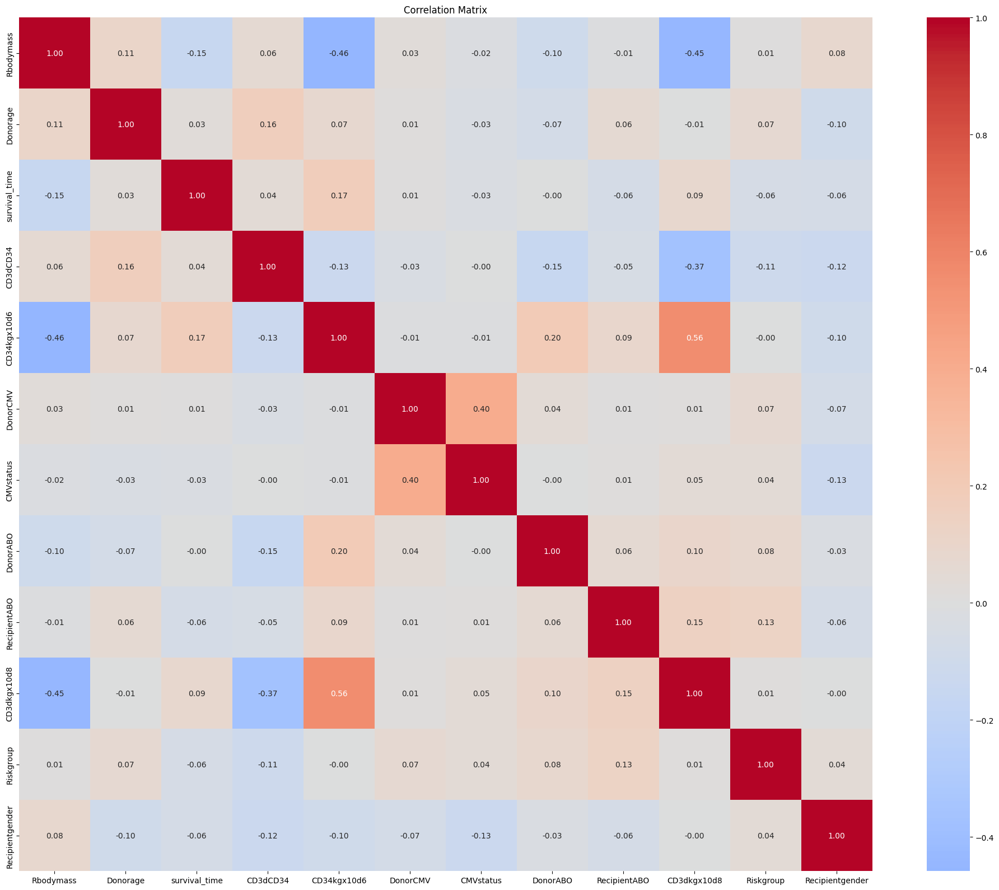

In [ ]:
df2 = df1[original_vars]
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(20, 16))

correlation_matrix = df2.corr()

sns.heatmap(correlation_matrix,
            annot=True,
            cmap='coolwarm',
            center=0,
            fmt='.2f',
            square=True)

plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()

In [ ]:
from ydata_profiling import ProfileReport

profile2 = ProfileReport(df2, title="Data Profiling Report")

# Création d'un fichier HTML pour le rapport
profile2.to_file("data_profile_report2.html")

c:\Users\JA236842\AppData\Local\Programs\Python\Python312\Lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## CONSTRUCTION DE MODELES

### METHODES DE REEQUILIBRAGE DES DONNEES

In [ ]:
# Isolation de la variable cible
df3 = pd.concat([df2, df1['survival_status']], axis=1)
Y2 = df3['survival_status']
X2 = df3.drop('survival_status', axis=1)

X2.shape, Y2.shape

((182, 12), (182,))


Répartition en pourcentage:
survival_status
0    54.95
1    45.05
Name: proportion, dtype: float64

Répartition en valeurs absolues:
survival_status
0    100
1     82
Name: count, dtype: int64


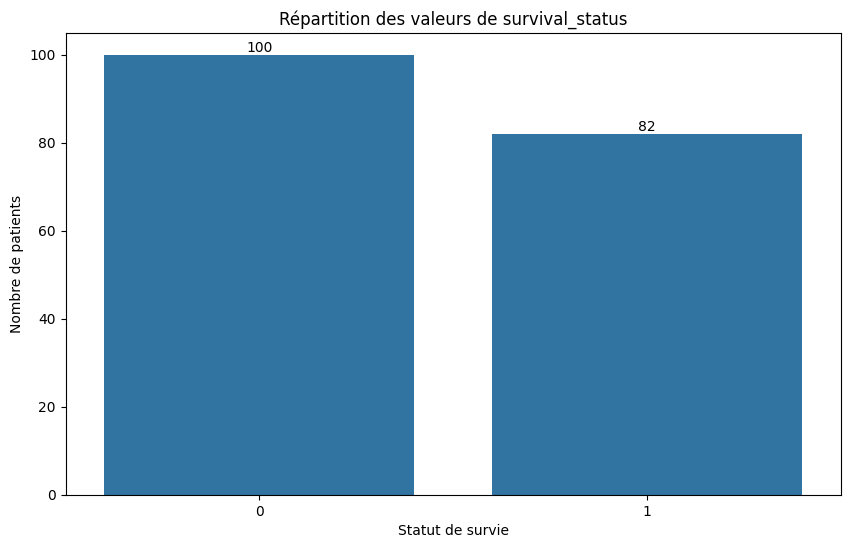

In [ ]:
# Afficher la distribution de Y2
import matplotlib.pyplot as plt
import seaborn as sns

# Créer une figure
plt.figure(figsize=(10, 6))

# Créer un countplot
sns.countplot(data=pd.DataFrame(Y2), x='survival_status')

for i in plt.gca().containers:
    plt.gca().bar_label(i)

plt.title('Répartition des valeurs de survival_status')
plt.xlabel('Statut de survie')
plt.ylabel('Nombre de patients')

# Afficher les statistiques
print("\nRépartition en pourcentage:")
print(Y2.value_counts(normalize=True).multiply(100).round(2))

# Afficher les valeurs absolues
print("\nRépartition en valeurs absolues:")
print(Y2.value_counts())

plt.show()

On constate ici que nos données sont quelque peu déséquilibrées. Nous avons une proportion de **54.95%** pour la classe `alive` contre **45.05%** pour la classe `dead`.

Ainsi, nous allons utiliser des méthodes de rééquilibrage pour améliorer cette situation et construire des modèles pour chaque cas de figures.

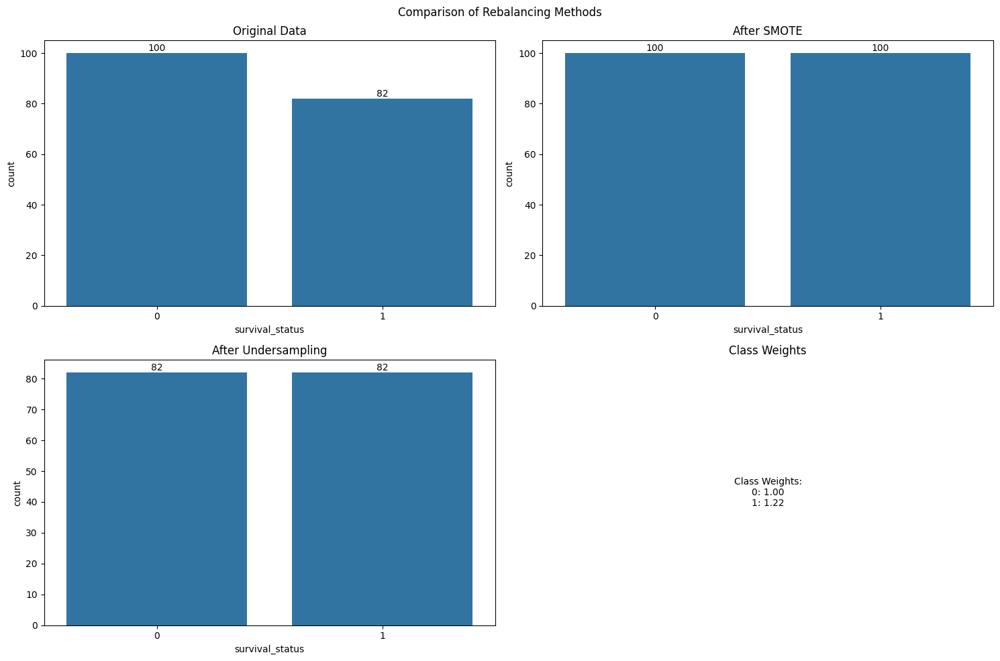


Distribution originale: Counter({0: 100, 1: 82})
Distribution SMOTE: Counter({0: 100, 1: 100})
Distribution Undersampling: Counter({0: 82, 1: 82})

Poids des classes: {0: 1, 1: 1.2195121951219512}


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

# 1. SMOTE (Oversampling)
smote = SMOTE(random_state=42)
X2_smote, Y2_smote = smote.fit_resample(X2, Y2)

# 2. Random Undersampling
undersampler = RandomUnderSampler(random_state=42)
X2_under, Y2_under = undersampler.fit_resample(X2, Y2)

# 3. Calcul des poids de classe
class_weights = dict(zip(
    Y2.unique(),
    [1 if c == 0 else (Y2 == 0).sum()/(Y2 == 1).sum() for c in Y2.unique()]
))

# Visualisation des résultats
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Comparison of Rebalancing Methods')

# Données originales
sns.countplot(data=pd.DataFrame(Y2), x='survival_status', ax=axes[0,0])
axes[0,0].set_title('Original Data')
axes[0,0].bar_label(axes[0,0].containers[0])

# SMOTE
sns.countplot(data=pd.DataFrame(Y2_smote), x='survival_status', ax=axes[0,1])
axes[0,1].set_title('After SMOTE')
axes[0,1].bar_label(axes[0,1].containers[0])

# Undersampling
sns.countplot(data=pd.DataFrame(Y2_under), x='survival_status', ax=axes[1,0])
axes[1,0].set_title('After Undersampling')
axes[1,0].bar_label(axes[1,0].containers[0])

# Affichage des poids de classe
axes[1,1].text(0.5, 0.5, f'Class Weights:\n0: {class_weights[0]:.2f}\n1: {class_weights[1]:.2f}',
               ha='center', va='center')
axes[1,1].set_title('Class Weights')
axes[1,1].axis('off')

plt.tight_layout()
plt.show()

# Affichage des résultats
print("\nDistribution originale:", Counter(Y2))
print("Distribution SMOTE:", Counter(Y2_smote))
print("Distribution Undersampling:", Counter(Y2_under))
print("\nPoids des classes:", class_weights)

### CONSTRUCTION DE MODELE AVEC LES DONNEES ORIGINALES